In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
%cd /content/drive/My Drive/Proj2

Mounted at /content/drive
/content/drive/My Drive/Proj2


# Setting Up

In [ ]:
!pip install ultralytics

In [ ]:
!pip install fiftyone
!pip install fiftyone-db-ubuntu2204

In [ ]:
import zipfile
import requests
import cv2
import matplotlib.pyplot as plt
import glob
import random
import os
from ultralytics import YOLO
import fiftyone as fo
import fiftyone.zoo as foz

# Dataset Preparation

In [ ]:
# Change where zoo datasets are downloaded
fo.config.dataset_zoo_dir = "/content/drive/My Drive/Proj2/datasets"

# Load the COCO-2017 dataset
# This will download it from the FiftyOne Dataset Zoo if necessary
dataset = foz.load_zoo_dataset("coco-2017", split="train", label_types=["detections"], classes=["person"], max_samples=3000)
dataset_test = foz.load_zoo_dataset("coco-2017", split="validation", label_types=["detections"], classes=["person"], max_samples=500)

# Print summary information about the view
print(dataset)

INFO:fiftyone.zoo.datasets:Downloading split 'train' to '/content/drive/My Drive/Proj2/datasets/coco-2017/train' if necessary


INFO:fiftyone.utils.coco:Downloading annotations to '/content/drive/My Drive/Proj2/datasets/coco-2017/tmp-download/annotations_trainval2017.zip'


 100% |██████|    1.9Gb/1.9Gb [5.0s elapsed, 0s remaining, 187.6Mb/s]       


INFO:eta.core.utils: 100% |██████|    1.9Gb/1.9Gb [5.0s elapsed, 0s remaining, 187.6Mb/s]       


Extracting annotations to '/content/drive/My Drive/Proj2/datasets/coco-2017/raw/instances_train2017.json'


INFO:fiftyone.utils.coco:Extracting annotations to '/content/drive/My Drive/Proj2/datasets/coco-2017/raw/instances_train2017.json'


INFO:fiftyone.utils.coco:Downloading 3000 images


 100% |████████████████| 3000/3000 [5.6m elapsed, 0s remaining, 9.4 images/s]       


INFO:eta.core.utils: 100% |████████████████| 3000/3000 [5.6m elapsed, 0s remaining, 9.4 images/s]       


Writing annotations for 3000 downloaded samples to '/content/drive/My Drive/Proj2/datasets/coco-2017/train/labels.json'


INFO:fiftyone.utils.coco:Writing annotations for 3000 downloaded samples to '/content/drive/My Drive/Proj2/datasets/coco-2017/train/labels.json'


Dataset info written to '/content/drive/My Drive/Proj2/datasets/coco-2017/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/content/drive/My Drive/Proj2/datasets/coco-2017/info.json'


Loading 'coco-2017' split 'train'


INFO:fiftyone.zoo.datasets:Loading 'coco-2017' split 'train'


 100% |███████████████| 3000/3000 [24.0s elapsed, 0s remaining, 101.5 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 3000/3000 [24.0s elapsed, 0s remaining, 101.5 samples/s]      


Dataset 'coco-2017-train-3000' created


INFO:fiftyone.zoo.datasets:Dataset 'coco-2017-train-3000' created


INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/content/drive/My Drive/Proj2/datasets/coco-2017/validation' if necessary


Found annotations at '/content/drive/My Drive/Proj2/datasets/coco-2017/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Found annotations at '/content/drive/My Drive/Proj2/datasets/coco-2017/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Downloading 500 images


 100% |██████████████████| 500/500 [57.5s elapsed, 0s remaining, 9.0 images/s]      


INFO:eta.core.utils: 100% |██████████████████| 500/500 [57.5s elapsed, 0s remaining, 9.0 images/s]      


Writing annotations for 500 downloaded samples to '/content/drive/My Drive/Proj2/datasets/coco-2017/validation/labels.json'


INFO:fiftyone.utils.coco:Writing annotations for 500 downloaded samples to '/content/drive/My Drive/Proj2/datasets/coco-2017/validation/labels.json'


Dataset info written to '/content/drive/My Drive/Proj2/datasets/coco-2017/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/content/drive/My Drive/Proj2/datasets/coco-2017/info.json'


Loading 'coco-2017' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'coco-2017' split 'validation'


 100% |█████████████████| 500/500 [3.3s elapsed, 0s remaining, 152.8 samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 500/500 [3.3s elapsed, 0s remaining, 152.8 samples/s]      


Dataset 'coco-2017-validation-500' created


INFO:fiftyone.zoo.datasets:Dataset 'coco-2017-validation-500' created


Name:        coco-2017-train-3000
Media type:  image
Num samples: 3000
Persistent:  False
Tags:        []
Sample fields:
    id:           fiftyone.core.fields.ObjectIdField
    filepath:     fiftyone.core.fields.StringField
    tags:         fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    ground_truth: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)


In [ ]:
# Adjust the file directories to replicate the directory style usage of YOLO

os.makedirs('datasets/coco-2017/images/train', exist_ok=True)
os.makedirs('datasets/coco-2017/images/val', exist_ok=True)

# Copying datasets
!cp datasets/coco-2017/train/data/*.jpg datasets/coco-2017/images/train
!cp datasets/coco-2017/validation/data/*.jpg datasets/coco-2017/images/val

In [ ]:
import json
from tqdm import tqdm
import shutil

def make_folders(path="output"):
    if os.path.exists(path):
        shutil.rmtree(path)
    os.makedirs(path)
    return path

def convert_bbox_coco2yolo(img_width, img_height, bbox):
    # YOLO bounding box format: [x_center, y_center, width, height]
    # (float values relative to width and height of image)
    x_tl, y_tl, w, h = bbox

    dw = 1.0 / img_width
    dh = 1.0 / img_height

    x_center = x_tl + w / 2.0
    y_center = y_tl + h / 2.0

    x = x_center * dw
    y = y_center * dh
    w = w * dw
    h = h * dh

    return [x, y, w, h]

def convert_coco_json_to_yolo_txt(output_path, json_file):

    path = make_folders(output_path)

    with open(json_file) as f:
        json_data = json.load(f)

    # write _darknet.labels, which holds names of all classes (one class per line)
    label_file = os.path.join(output_path, "_darknet.labels")
    with open(label_file, "w") as f:
        for category in tqdm(json_data["categories"], desc="Categories"):
            category_name = category["name"]
            f.write(f"{category_name}\n")

    for image in tqdm(json_data["images"], desc="Annotation txt for each image"):
        img_id = image["id"]
        img_name = image["file_name"]
        img_width = image["width"]
        img_height = image["height"]

        anno_in_image = [anno for anno in json_data["annotations"] if anno["image_id"] == img_id]
        anno_txt = os.path.join(output_path, img_name.split(".")[0] + ".txt")
        with open(anno_txt, "w") as f:
            for anno in anno_in_image:
                category = anno["category_id"] - 1
                if category == 0:
                  bbox_COCO = anno["bbox"]
                  x, y, w, h = convert_bbox_coco2yolo(img_width, img_height, bbox_COCO)
                  f.write(f"{category} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")

    print("Converting COCO Json to YOLO txt finished!")

In [ ]:
# Adjust the file directories to replicate the directory style usage of YOLO

os.makedirs('datasets/coco-2017/labels/train', exist_ok=True)
os.makedirs('datasets/coco-2017/labels/val', exist_ok=True)

In [ ]:
convert_coco_json_to_yolo_txt("datasets/coco-2017/labels/train", "datasets/coco-2017/train/labels.json") #converting labels to YOLO format

Annotation txt for each image: 100%|██████████| 3000/3000 [00:33<00:00, 89.47it/s]

Converting COCO Json to YOLO txt finished!


In [ ]:
convert_coco_json_to_yolo_txt("datasets/coco-2017/labels/val", "datasets/coco-2017/validation/labels.json") #converting labels to YOLO format

Annotation txt for each image: 100%|██████████| 500/500 [00:02<00:00, 190.91it/s]

Converting COCO Json to YOLO txt finished!


In [ ]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # Denormalize the coordinates.
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)

        thickness = max(2, int(w/275))

        cv2.rectangle(
            image,
            (xmin, ymin), (xmax, ymax),
            color=(0, 0, 255),
            thickness=thickness
        )
    return image

In [ ]:
# Function to plot images with the bounding boxes
def plot(image_paths, label_paths, num_samples):
    all_images = []
    all_images.extend(glob.glob(image_paths+'/*.jpg'))
    all_images.extend(glob.glob(image_paths+'/*.JPG'))

    all_images.sort()

    num_images = len(all_images)

    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image_name = all_images[j]
        image_name = '.'.join(image_name.split(os.path.sep)[-1].split('.')[:-1])
        image = cv2.imread(all_images[j])
        with open(os.path.join(label_paths, image_name+'.txt'), 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=1)
    plt.tight_layout()
    plt.show()

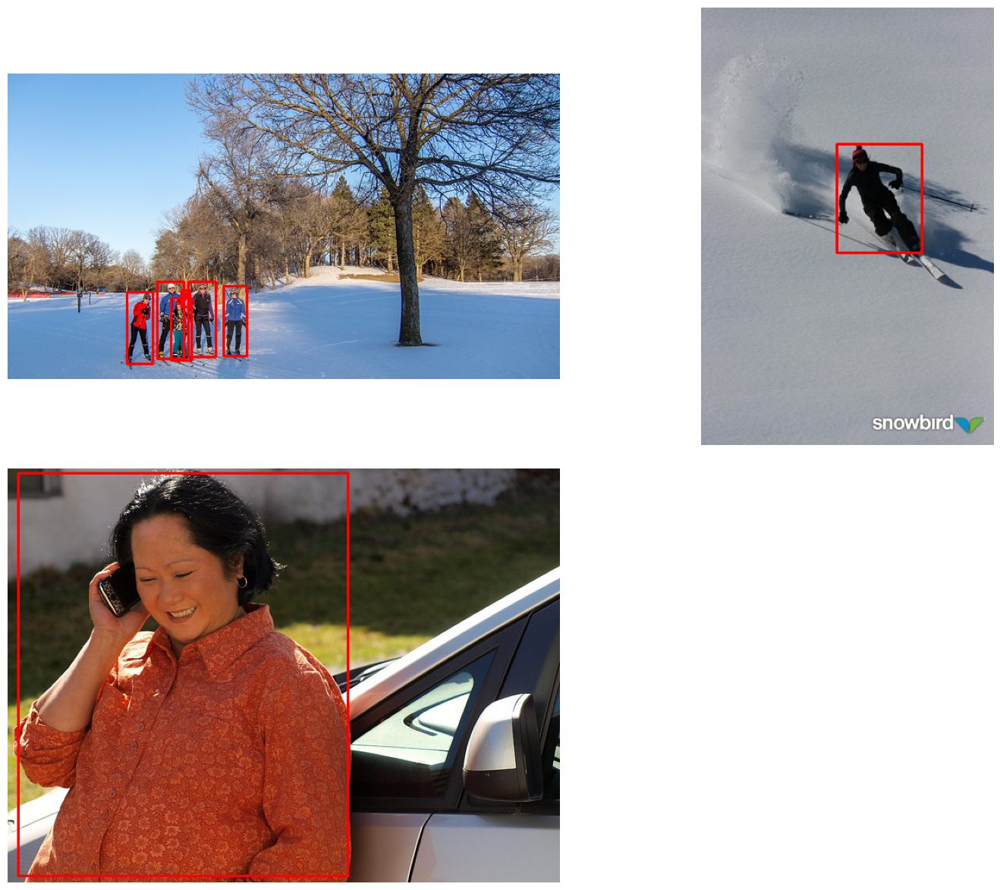

In [ ]:
# Visualize a few training images
plot(
    image_paths='datasets/coco-2017/images/train',
    label_paths='datasets/coco-2017/labels/train',
    num_samples=3
)

# YAML File

YAML file is used to redirect paths for training/validation

In [ ]:
#Create the YAML file, adjusting according to the required class to be deteced, i.e. person

%%writefile coco_person.yaml
train: '/content/drive/MyDrive/Proj2/datasets/coco-2017/images/train'
val: '/content/drive/MyDrive/Proj2/datasets/coco-2017/images/val'

# class names
names:
  0: 'person'


Overwriting coco_person.yaml


# Training

In [ ]:
train_model = 'yolov8l.yaml'
pretrained_weight = 'yolov8l.pt'

EPOCHS = 50

project = '/content/drive/My Drive/Proj2/logs'
experiment = 'yolov8_50'

train_data = 'coco_person.yaml'

In [ ]:
# Logging
os.makedirs(project, exist_ok=True)

In [ ]:
# Build from YAML and transfer weights
model = YOLO(train_model).load(pretrained_weight)

results = model.train(
    data=train_data,
    epochs=EPOCHS,
    imgsz=640,
    project=project,
    name=experiment,
)


                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  3    279808  ultralytics.nn.modules.block.C2f             [128, 128, 3, True]           
  3                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  4                  -1  6   2101248  ultralytics.nn.modules.block.C2f             [256, 256, 6, True]           
  5                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256, 512, 3, 2]              
  6                  -1  6   8396800  ultralytics.nn.modules.block.C2f             [512, 512, 6, True]           
  7                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512

100%|██████████| 755k/755k [00:00<00:00, 16.9MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  3    279808  ultralytics.nn.modules.block.C2f             [128, 128, 3, True]           
  3                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  4                  -1  6   2101248  ultralytics.nn.modules.block.C2f             [256, 256, 6, True]           
  5                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256, 512, 3, 2]              
  6                  -1  6   8396800  ultralytics.nn.modules.block.C2f             [512, 512, 6, True]           
  7                  -1  1   2360320  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 59.4MB/s]


WARNING ⚠️ NMS time limit 0.550s exceeded
AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/Proj2/datasets/coco-2017/labels/train... 3000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3000/3000 [00:14<00:00, 211.11it/s]


train: New cache created: /content/drive/MyDrive/Proj2/datasets/coco-2017/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/Proj2/datasets/coco-2017/labels/val... 500 images, 0 backgrounds, 0 corrupt: 100%|██████████| 500/500 [00:05<00:00, 99.02it/s] 


val: New cache created: /content/drive/MyDrive/Proj2/datasets/coco-2017/labels/val.cache
Plotting labels to /content/drive/My Drive/Proj2/logs/yolov8_503/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50        11G      1.426       1.55      1.495         78        640: 100%|██████████| 188/188 [02:40<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:11<00:00,  1.37it/s]

                   all        500       2090      0.098      0.209     0.0686     0.0238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      11.4G      1.816      1.958      1.787         47        640: 100%|██████████| 188/188 [02:36<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.47it/s]

                   all        500       2090      0.348      0.322      0.256      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      11.4G       1.78        1.9      1.749         73        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.83it/s]

                   all        500       2090      0.436      0.365      0.339       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      11.4G      1.705       1.83      1.704         22        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.88it/s]

                   all        500       2090       0.49      0.409      0.398      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      11.4G       1.64       1.72      1.647         68        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.62it/s]

                   all        500       2090      0.559      0.438      0.463      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      11.4G       1.56      1.634      1.593         60        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.53it/s]

                   all        500       2090      0.562      0.443      0.476      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      11.4G      1.528      1.566      1.576         84        640: 100%|██████████| 188/188 [02:34<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.78it/s]

                   all        500       2090      0.581      0.466      0.497      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      11.3G      1.492      1.513      1.546         61        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:12<00:00,  1.31it/s]

                   all        500       2090      0.619      0.502      0.544      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      11.4G       1.45      1.485      1.524         57        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.87it/s]

                   all        500       2090      0.581       0.47      0.491      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      11.5G      1.436      1.447       1.51         63        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.54it/s]

                   all        500       2090      0.646      0.499       0.56      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      11.5G      1.416       1.42        1.5         48        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.81it/s]

                   all        500       2090      0.668      0.504      0.579      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      11.4G      1.397      1.395      1.484         50        640: 100%|██████████| 188/188 [02:34<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.80it/s]

                   all        500       2090      0.646      0.534      0.587      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      11.4G      1.361      1.345      1.462         41        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.60it/s]

                   all        500       2090      0.636      0.542      0.591      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      11.4G      1.338      1.313      1.442         63        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.61it/s]

                   all        500       2090      0.637      0.554      0.599      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      11.3G      1.317       1.28      1.431         41        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.72it/s]

                   all        500       2090      0.654      0.529      0.591      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      11.3G      1.314      1.278      1.427         59        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.59it/s]

                   all        500       2090      0.652      0.545      0.606      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      11.4G        1.3      1.249      1.412         45        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.74it/s]

                   all        500       2090      0.663      0.549      0.609      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      11.4G      1.292       1.23      1.408         73        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.86it/s]

                   all        500       2090      0.694      0.569      0.642      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      11.4G      1.258      1.197       1.39         42        640: 100%|██████████| 188/188 [02:34<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.70it/s]

                   all        500       2090      0.653      0.574      0.628       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      11.4G      1.239      1.173      1.378         45        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:11<00:00,  1.45it/s]

                   all        500       2090      0.673      0.595      0.649      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      11.4G      1.218      1.145       1.37         56        640: 100%|██████████| 188/188 [02:34<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.89it/s]

                   all        500       2090      0.676       0.58      0.638      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      11.3G      1.215       1.13      1.361         83        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.76it/s]

                   all        500       2090      0.677      0.581      0.648      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      11.3G      1.195      1.112      1.346         50        640: 100%|██████████| 188/188 [02:34<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.90it/s]

                   all        500       2090      0.689      0.588      0.652      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      11.4G      1.177      1.093      1.338         53        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.80it/s]

                   all        500       2090      0.702       0.59      0.658      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      11.4G      1.173      1.091      1.335         50        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.71it/s]

                   all        500       2090      0.746      0.589      0.673      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      11.5G      1.164       1.07      1.332         73        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.88it/s]

                   all        500       2090      0.724      0.568      0.659       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      11.4G      1.168       1.07      1.335         64        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.56it/s]

                   all        500       2090      0.738      0.582      0.672      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      11.3G      1.136      1.026      1.305         56        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.56it/s]

                   all        500       2090      0.717      0.599      0.678      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      11.5G      1.133      1.019      1.312         39        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.54it/s]

                   all        500       2090      0.719      0.605      0.674      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      11.3G      1.118      1.017      1.303         40        640: 100%|██████████| 188/188 [02:36<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.67it/s]

                   all        500       2090      0.744      0.589      0.678       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      11.3G      1.115      1.002      1.295         91        640: 100%|██████████| 188/188 [02:36<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:11<00:00,  1.44it/s]

                   all        500       2090      0.713      0.605      0.673       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      11.4G      1.092     0.9589      1.274         63        640: 100%|██████████| 188/188 [02:36<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.66it/s]

                   all        500       2090      0.725      0.627      0.693      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      11.4G      1.076      0.948      1.272         66        640: 100%|██████████| 188/188 [02:36<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.88it/s]

                   all        500       2090      0.735       0.61      0.686      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      11.5G      1.071     0.9357      1.265         60        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.56it/s]

                   all        500       2090      0.727      0.623      0.695      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      11.3G      1.059     0.9243      1.261         59        640: 100%|██████████| 188/188 [02:36<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.65it/s]

                   all        500       2090      0.726      0.611      0.684      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      11.4G      1.043     0.9157      1.254         72        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.86it/s]

                   all        500       2090      0.726      0.621      0.698      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      11.4G      1.043     0.9023      1.248         55        640: 100%|██████████| 188/188 [02:34<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.52it/s]

                   all        500       2090      0.753        0.6      0.691      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      11.4G      1.027     0.8887      1.244         50        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]

                   all        500       2090      0.742      0.622      0.698       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      11.3G      1.016     0.8654      1.236         80        640: 100%|██████████| 188/188 [02:36<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.52it/s]

                   all        500       2090      0.761      0.623      0.702      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      11.3G      1.007     0.8466      1.216         32        640: 100%|██████████| 188/188 [02:36<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.88it/s]

                   all        500       2090      0.761      0.626      0.709      0.468


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      11.3G     0.9814     0.7974      1.195         28        640: 100%|██████████| 188/188 [02:37<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.85it/s]

                   all        500       2090      0.749      0.622      0.702      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      11.4G     0.9523     0.7523      1.174         39        640: 100%|██████████| 188/188 [02:34<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.54it/s]

                   all        500       2090      0.798      0.589      0.706      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      11.4G     0.9482     0.7457      1.169         28        640: 100%|██████████| 188/188 [02:34<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.61it/s]

                   all        500       2090      0.747      0.617      0.702      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      11.4G     0.9381      0.717      1.158         54        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.79it/s]

                   all        500       2090      0.763      0.623      0.713       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      11.4G     0.9205     0.7093      1.151         56        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.57it/s]

                   all        500       2090      0.772      0.629      0.715      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      11.3G     0.9047     0.6905      1.145         17        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.89it/s]

                   all        500       2090      0.767      0.625      0.715      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      11.4G     0.8833      0.669      1.123         57        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.51it/s]

                   all        500       2090       0.75      0.645      0.719      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      11.4G     0.8868     0.6633      1.127         44        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.64it/s]

                   all        500       2090      0.761      0.634      0.718      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      11.5G     0.8759     0.6505      1.117         21        640: 100%|██████████| 188/188 [02:33<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.55it/s]

                   all        500       2090      0.762       0.64      0.721      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      11.5G     0.8587     0.6284      1.106         19        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.60it/s]

                   all        500       2090      0.751      0.656      0.722      0.481



50 epochs completed in 2.441 hours.
Optimizer stripped from /content/drive/My Drive/Proj2/logs/yolov8_503/weights/last.pt, 87.6MB
Optimizer stripped from /content/drive/My Drive/Proj2/logs/yolov8_503/weights/best.pt, 87.6MB

Validating /content/drive/My Drive/Proj2/logs/yolov8_503/weights/best.pt...
Ultralytics YOLOv8.0.235 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l summary (fused): 268 layers, 43607379 parameters, 0 gradients, 164.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:14<00:00,  1.13it/s]


                   all        500       2090       0.75      0.656      0.722      0.482
Speed: 0.2ms preprocess, 12.4ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to /content/drive/My Drive/Proj2/logs/yolov8_503


In [ ]:
%load_ext tensorboard
%tensorboard --logdir .

<IPython.core.display.Javascript object>

# Predict

Once trained and validated using the YAML file above, we can then now predict using some exemplary contents taken from the internet.

In [ ]:
#predicting using an image with multiple persons
!yolo predict model='/content/drive/MyDrive/Proj2/logs/yolov8_503/weights/best.pt' source='https://ultralytics.com/images/zidane.jpg'

Ultralytics YOLOv8.0.235 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l summary (fused): 268 layers, 43607379 parameters, 0 gradients, 164.8 GFLOPs

Found https://ultralytics.com/images/zidane.jpg locally at zidane.jpg
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/Proj2/zidane.jpg: 384x640 4 persons, 355.9ms
Speed: 8.8ms preprocess, 355.9ms inference, 2155.8ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [ ]:
#predicting using a video
!yolo predict model='/content/drive/MyDrive/Proj2/logs/yolov8_503/weights/best.pt' source='https://i.pinimg.com/originals/17/b8/88/17b88830421465369c0e79532cf7b8cb.jpg'

Ultralytics YOLOv8.0.235 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l summary (fused): 268 layers, 43607379 parameters, 0 gradients, 164.8 GFLOPs

100% 517k/517k [00:00<00:00, 11.8MB/s]
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/Proj2/17b88830421465369c0e79532cf7b8cb.jpg: 640x288 1 person, 87.0ms
Speed: 3.5ms preprocess, 87.0ms inference, 1395.8ms postprocess per image at shape (1, 3, 640, 288)
Results saved to runs/detect/predict4
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [ ]:
#predicting using an image with a single person
!yolo predict model='/content/drive/MyDrive/Proj2/logs/yolov8_503/weights/best.pt' source='/content/drive/MyDrive/Proj2/people.mp4'

Ultralytics YOLOv8.0.235 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l summary (fused): 268 layers, 43607379 parameters, 0 gradients, 164.8 GFLOPs

video 1/1 (1/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 12 persons, 117.6ms
video 1/1 (2/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 12 persons, 39.6ms
video 1/1 (3/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 12 persons, 39.4ms
video 1/1 (4/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 13 persons, 36.8ms
video 1/1 (5/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 13 persons, 32.0ms
video 1/1 (6/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 11 persons, 32.0ms
video 1/1 (7/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 11 persons, 31.9ms
video 1/1 (8/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 9 persons, 32.0ms
video 1/1 (9/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 8 persons, 23.1ms
video 1/1 (10/3493) /content/drive/MyDrive/Pr

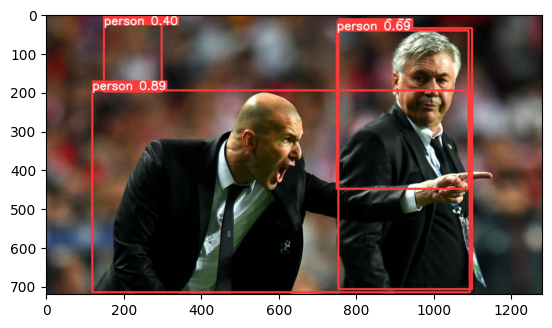

In [ ]:
#The result of the prediction using an image with multiple persons
import os
import matplotlib.pyplot as plt
img1 = plt.imread('/content/drive/MyDrive/Proj2/runs/detect/predict3/zidane.jpg')
plt.imshow(img1)

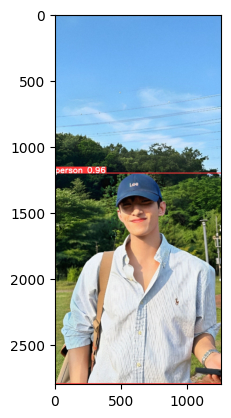

In [ ]:
#the result of the prediction using an image with ma single person
img2 = plt.imread('/content/drive/MyDrive/Proj2/runs/detect/predict4/17b88830421465369c0e79532cf7b8cb.jpg')
plt.imshow(img2)